<a href="https://colab.research.google.com/github/alexsouza1989/DIAGNOSTICO_COVID/blob/main/FLEURY_PRE_PROCESSAMENTO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

In [ ]:
#ARQUIVOS REFERENTES À JUNHO DE 2021
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
exames = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/GrupoFleury_Exames_4.csv', sep='|')

In [ ]:
exames = exames.drop_duplicates(['ID_PACIENTE', "ID_ATENDIMENTO", "DT_COLETA", 'DE_ORIGEM', 'DE_EXAME', 'DE_ANALITO', 'DE_RESULTADO', 'CD_UNIDADE', 'DE_VALOR_REFERENCIA'], keep='first') 

In [ ]:
pacientes = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/GrupoFleury_Pacientes_4.csv', sep='|')

In [ ]:
novo_df_fleury = exames.merge(pacientes, on = ["ID_PACIENTE"], how = "left")

In [ ]:
novo_df_fleury.to_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_JUNTADO.csv')

In [ ]:
novo_df_fleury

,ID_PACIENTE,ID_ATENDIMENTO,DT_COLETA,DE_ORIGEM,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,DE_VALOR_REFERENCIA,IC_SEXO,AA_NASCIMENTO,CD_PAIS,CD_UF,CD_MUNICIPIO,CD_CEPREDUZIDO
0,1AD07C7A1E4D80B608DD7A650766CCF0,0EFB904D796353895CE21966A95EE994,19/03/2020,LAB,"NOVO CORONAVÍRUS 2019 (SARS-CoV-2), DETECÇÃO P...","Covid 19, Detecção por PCR",NÃO DETECTADO,NaN,Não detectado,M,1961,BR,SP,SAO PAULO,CCCC
1,1AD07C7A1E4D80B608DD7A650766CCF0,0EFB904D796353895CE21966A95EE994,19/03/2020,LAB,"NOVO CORONAVÍRUS 2019 (SARS-CoV-2), DETECÇÃO P...","Covid 19, Material",raspado de nasofaringe,NaN,NaN,M,1961,BR,SP,SAO PAULO,CCCC
2,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,LAB,"HEMOGRAMA, sangue total",Hemoglobina,"16,1",g/dL,"13,5 a 17,5",M,1961,BR,SP,SAO PAULO,CCCC
3,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,LAB,"HEMOGRAMA, sangue total",VCM,"86,1",fL,"81,0 a 95,0",M,1961,BR,SP,SAO PAULO,CCCC
4,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,LAB,"HEMOGRAMA, sangue total",Leucócitos,5250,/mm3,3.500 a 10.500,M,1961,BR,SP,SAO PAULO,CCCC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39538354,6A18BB8398D9C24179A49BE71BB48998,FD7BB139C1A9E7D8EB0F1115C3B3865F,28/05/2021,LAB,"COVID19, ANTICORPOS TOTAIS, soro","Covid 19, Anticorpos Totais, Eletroquimiolumi",REAGENTE,NaN,Não reagente,F,1979,BR,RJ,RIO DE JANEIRO,20756
39538355,6A18BB8398D9C24179A49BE71BB48998,FD7BB139C1A9E7D8EB0F1115C3B3865F,28/05/2021,LAB,"COVID19, ANTICORPOS IgM, soro","Covid 19, Anticorpos IgM, Quimiolumin.-Índice","0,1",UA/mL,"inferior a 0,8",F,1979,BR,RJ,RIO DE JANEIRO,20756
39538356,6A18BB8398D9C24179A49BE71BB48998,FD7BB139C1A9E7D8EB0F1115C3B3865F,28/05/2021,LAB,"COVID19, ANTICORPOS IgM, soro","Covid 19, Anticorpos IgM, Quimioluminescência",não reagente,NaN,Não reagente,F,1979,BR,RJ,RIO DE JANEIRO,20756
39538357,6A18BB8398D9C24179A49BE71BB48998,FD7BB139C1A9E7D8EB0F1115C3B3865F,28/05/2021,LAB,"COVID19, ANTICORPOS IgM, soro","Covid 19, Sorologia - Interpretação",Detectados anticorpos totais contra SARS-CoV-2...,NaN,NaN,F,1979,BR,RJ,RIO DE JANEIRO,20756


**REEINICIANDO AS ANÁLISES**

In [ ]:
fleury_juntado = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_JUNTADO.csv', sep=',')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
fleury_juntado.info()

In [ ]:
fleury_juntado= fleury_juntado.drop(columns=["CD_PAIS", 'CD_UF', 'CD_MUNICIPIO', 'CD_CEPREDUZIDO'])

In [ ]:
fleury_juntado.to_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_JUNTADO_2.csv')

**LENDO ARQUIVOS SEM AS COLUNAS: "CD_PAIS", 'CD_UF', 'CD_MUNICIPIO', 'CD_CEPREDUZIDO'**

In [ ]:
fleury_juntado = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_JUNTADO_2.csv', sep=',') #DATASET IMPORTANTE NA HORA DE IDENTIFICAR OS PACIENTES

In [ ]:
fleury_juntado= fleury_juntado.drop(columns=["DE_VALOR_REFERENCIA", "Unnamed: 0", 'Unnamed: 0.1', "DE_ORIGEM"])

In [ ]:
fleury_juntado.info()

In [ ]:
fleury_juntado.to_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_DF.csv')

**SELECIONADO PACIENTES QEU FIZERAM EXAMES PARA COVID**

In [ ]:
fleury_juntado['DE_EXAME']

In [ ]:
filtro_1 = ['Covid 19', 'Covid 19, Detecção por PCR', 'Covid 19, Material', 'Covid 19, Anticorpos Totais, Eletroquimiolumi',
            'Covid 19, Anticorpos IgM, Quimiolumin.-Índice','Covid 19, Anticorpos IgM, Quimioluminescência', 'Covid 19, Sorologia - Interpretação',
            'Covid 19, Sorologia - Conclusão', 'Sorologia - Coronavírus, IgG', 'Sorologia - Coronavírus, IgA', 
            'Detecção de Coronavírus (NCoV-2019) POR PCR (Anatomia Patológica)',
            "COVID-19, anticorpos IGA e IGG, soro",
            'COVID-19-Teste Rápido (IgM e IgG), soro',
            "COVID19, ANTICORPOS IgM, soro",
            'COVID19, ANTICORPOS IgG, soro',
            'COVID19, ANTICORPOS TOTAIS, soro',
            'NOVO CORONAVÍRUS 2019(SARS-CoV-2), DETECÇÃO POR PCR',
            'OLECULAR RÁPIDO PARA DETECÇÃO DE SARS-CoV-2 (COVID-19)',
            'TESTE RÁPIDO PARA DETECÇÃO DE ANTÍGENO DE SARS-CoV-2 (COVID-19)',
            'TESTE MOLECULAR RÁPIDO PARA DETECÇÃO DE SARS-CoV-2 (COVID-19)',
            'SARS-CoV-2, ANTICORPOS IgM E IgG, TESTE RÁPIDO',
            'TESTE MOLECULAR PARA DETECÇÃO DE SARS-CoV-2 (COVID-19)',
            'COVID-19, PESQUISA DE ANTÍGENO POR PROTEÔMICA DIRECIONADA'

            ]

In [ ]:
len(filtro_1)

In [ ]:
testados_para_covid = fleury_juntado[fleury_juntado.DE_ANALITO.isin(filtro_1)] 

In [ ]:
testados_para_covid['DE_EXAME'].value_counts()

COVID19, ANTICORPOS IgM, soro                                      2004351
NOVO CORONAVÍRUS 2019 (SARS-CoV-2), DETECÇÃO POR PCR                923135
COVID19, ANTICORPOS TOTAIS, soro                                    453577
TESTE MOLECULAR RÁPIDO PARA DETECÇÃO DE SARS-CoV-2 (COVID-19)        10202
SARS-CoV-2, ANTICORPOS IgM E IgG, TESTE RÁPIDO                        5257
TESTE MOLECULAR PARA DETECÇÃO DE SARS-CoV-2 (COVID-19)                3402
TESTE RÁPIDO PARA DETECÇÃO DE ANTÍGENO DE SARS-CoV-2 (COVID-19)       1410
COVID-19, PESQUISA DE ANTÍGENO POR PROTEÔMICA DIRECIONADA              165
Name: DE_EXAME, dtype: int64

In [ ]:
testados_para_covid.to_csv('/content/drive/MyDrive/LAB_FLEURY/TESTADOS_COVID.csv', index=False)

**A PARTIR DAQUI OS DADOS SÃO SOBRE PACIENTES TESTADOS P/ COVID (POSITIVO OU NEGATIVO**

In [ ]:
pacientes_testados = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/TESTADOS_COVID.csv', sep=',')

In [ ]:
ver_exames =  pacientes_testados[pacientes_testados.DE_EXAME.isin(filtro_1)] 

In [ ]:
ver_exames['DE_EXAME'].value_counts()

# <font color='blue'>
O primeiro ponto é indetificar os casos positivos e negativos. Não há uma padronização no resulta, o que dificulta a extração de dados. </font> 

In [ ]:
#BUSCANDO PACIENTES POSITIVOS
casos_positivos = ['DETECTADO', 'Detectado',
                   'POSITIVO', 'Positivo', 
                   'REAGENTE', 'Reagente',
                   'DETECTADO (POSITIVO']

In [ ]:
#BUSCANDO PACIENTES NEGATIVOS
casos_negativos = ['NÃO DETECTADO', 'Não detectado',
                   'NEGATIVO', 'Negativo', 
                   'NÃO REAGENTE', 'Não reagente',
                   'não reagente'
                   'NÃO DETECTADO (NEGATIVO)']

In [ ]:
df_covid_positivo = pacientes_testados.loc[pacientes_testados['DE_RESULTADO'].isin(casos_positivos)] #PACIENTES POSITIVOS NO DATASET GERAL
df_covid_positivo.info()

In [ ]:
df_covid_negativo = pacientes_testados.loc[pacientes_testados['DE_RESULTADO'].isin(casos_negativos)]   #PACIENTES NEGATIVOS NO DATASET GERAL
df_covid_negativo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 740202 entries, 0 to 3401489
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   ID_PACIENTE     740202 non-null  object
 1   ID_ATENDIMENTO  740202 non-null  object
 2   DT_COLETA       740202 non-null  object
 3   DE_EXAME        740202 non-null  object
 4   DE_ANALITO      740202 non-null  object
 5   DE_RESULTADO    740202 non-null  object
 6   CD_UNIDADE      0 non-null       object
 7   IC_SEXO         740202 non-null  object
 8   AA_NASCIMENTO   740202 non-null  object
dtypes: object(9)
memory usage: 56.5+ MB


<font color='blue'> Há diversos resultados que podem apontar um paciente negativo ou positivo. Este formato de informação demanda a presença de especilista e um maior tempo de processamento. Utilizou-se para separar os pacientes strings convencionais

In [ ]:
#BUSCANDO OS PACIENTES QEU TESTARAM POSITIVOS NA BASE DO PACIENTES GERAIS.
positivos = fleury_juntado.loc[fleury_juntado['ID_PACIENTE'].isin(df_covid_positivo['ID_PACIENTE'])]


#BUSCANDO OS PACIENTES QEU TESTARAM NEGATIVO NA BASE DO PACIENTES GERAIS.
negativos = fleury_juntado.loc[fleury_juntado['ID_PACIENTE'].isin(df_covid_negativo['ID_PACIENTE'])]

In [ ]:
positivos['DE_EXAME'].value_counts()

HEMOGRAMA, sangue total                                            3107446
URINA TIPO I - JATO MEDIO                                           753956
COVID19, ANTICORPOS IgM, soro                                       651227
COVID19, ANTICORPOS IgG, soro                                       356009
COVID19, ANTICORPOS TOTAIS, soro                                    307084
                                                                    ...   
IGE ESPECIFICO, C5 - AMPICILINA, soro                                    1
D-XILOSE, PROVA DE ABSORCAO ORAL, plasma                                 1
IgE ESPECÍFICO, rAha H1 AMENDOIM, soro                                   1
IgE ESPECÍFICO, rAha H2 AMENDOIM, soro                                   1
TESTE DE SUPRESSÃO DO CORTISOL, APÓS 2 MG DE DEXAMETASONA, soro          1
Name: DE_EXAME, Length: 818, dtype: int64

In [ ]:
negativos['DE_EXAME'].value_counts()

HEMOGRAMA, sangue total                                     8149006
URINA TIPO I - JATO MEDIO                                   2158453
COVID19, ANTICORPOS IgM, soro                               1782086
COVID19, ANTICORPOS IgG, soro                               1055807
COVID19, ANTICORPOS TOTAIS, soro                             807696
                                                             ...   
PESQUISA DE ROTAVIRUS, fezes                                      1
ANTICORPOS ANTI-FRANCISELLA TULARENSIS (TULAREMIA), soro          1
PESQUISA DE LEPTOSPIRA                                            1
ALFA-2-MACROGLOBULINA, soro                                       1
IgE ESPECÍFICO, rAha H1 AMENDOIM, soro                            1
Name: DE_EXAME, Length: 867, dtype: int64

<font color='blue'> Aqui temos apenas os pacientes testados e seus respectivos exames, excluindo-se os exames de COVI-19. logo, aqui estão os exames clínicos necessários

In [ ]:
verificacao=pd.concat([positivos, negativos])

In [ ]:
verificacao = verificacao[~verificacao.DE_EXAME.isin(filtro_1)] 

In [ ]:
verificacao.info()

In [ ]:
verificacao = verificacao.drop_duplicates(['ID_PACIENTE', "ID_ATENDIMENTO", "DT_COLETA", 'DE_EXAME', 'DE_ANALITO', 'DE_RESULTADO'], keep='first') 

In [ ]:
verificacao['DE_EXAME'].value_counts()  #PAREI AQUI

In [ ]:
! pip install sweetviz

In [ ]:
import sweetviz as sv

In [ ]:
verificacao['AA_NASCIMENTO'] = pd.to_numeric(verificacao['AA_NASCIMENTO'], errors='coerce')

In [ ]:
relatorio_verificação = sv.analyze(verificacao)
relatorio_verificação.show_html()

In [ ]:
exames_realizados = ['HEMOGRAMA, sangue total', 'URINA TIPO I - JATO MEDIO',
                     'BILIRRUBINAS, soro', 'INSULINA, soro',
                     'CREATININA, soro', 'HORMONIO TIROESTIMULANTE (TSH), soro',
                     'TRANSAMINASE GLUTAMICO-PIRUVICA (TGP)', 'Outros']

numero_exames = [37, 10, 2, 1, 1, 1, 1, 46]

In [ ]:
plt.figure(figsize=(6,4))
plt.barh(exames_realizados, numero_exames, color='green')
plt.ylabel('Exames', size = 11)
plt.xlabel('Pacientes que realizaram os exames (%)', size=11)
plt.show()

In [ ]:
analise_urina = verificacao.loc[verificacao['DE_EXAME'] == "URINA TIPO I - JATO MEDIO"]

In [ ]:
analise_urina['DE_RESULTADO'].value_counts()

<font color='blue'> Com base no observado, exame de sangue e urina foram os exames mais realizados além dos exames de COVID. Dessa forma, estes dois exames foram selecionado para compor um dataset final para predição de COVID

In [ ]:
analise_urina = positivos.loc[positivos['DE_EXAME'] == "URINA TIPO I - JATO MEDIO"]
analise_urina['DE_RESULTADO']. value_counts()

<font color='blue'> Como observado acima, o exame de urina, apenas para os pacientes testados como positivos, possuem 1678 tipos de resultados (saídas), tornado o uso deste dado impossível sem um processamento apenas desse exame. Dessa forma, este exame passa a ser excluído e apenas o exame de sangue passa a ser considerado

**A PARTIR DAQUI SERÃO CONSIDERADO APENAS PACIENTES QUE REALIZARAM O EXAME HEMOGRAMA "HEMOGRAMA, sangue total"**


In [ ]:
positivos_hemograma = positivos.loc[positivos['DE_EXAME'] == "HEMOGRAMA, sangue total"]
negativo_hemograma = negativos.loc[negativos['DE_EXAME'] == "HEMOGRAMA, sangue total"]

In [ ]:
positivos_hemograma.head(1)

In [ ]:
negativo_hemograma.head(1)

In [ ]:
positivos_hemograma.to_csv('/content/drive/MyDrive/LAB_FLEURY/POSITIVOS_FLEURY.csv', index=False)
negativo_hemograma.to_csv('/content/drive/MyDrive/LAB_FLEURY/NEGATIVOS_FLEURY.csv', index=False)

<font color='blue'> A PARTIR DESTE PONTO SEGUE NO COLAB (https://colab.research.google.com/drive/1wOEu_DeT7AKhbZEp6NIWKqi4TF5WoxeN?usp=sharing)



In [ ]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter
import collections

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')
  

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
positivos = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/POSITIVOS_FLEURY.csv', sep=',')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
negativo = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/NEGATIVOS_FLEURY.csv', sep=',')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df_fleury_final = negativo.assign(DIAGNOSTICO=negativo.ID_PACIENTE.isin(positivos.ID_PACIENTE).astype(int))

In [ ]:
df_fleury_final.head(5)

,ID_PACIENTE,ID_ATENDIMENTO,DT_COLETA,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,IC_SEXO,AA_NASCIMENTO,DIAGNOSTICO
0,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Hemoglobina,"16,1",g/dL,M,1961,0
1,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",VCM,"86,1",fL,M,1961,0
2,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Leucócitos,5250,/mm3,M,1961,0
3,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Neutrófilos,2930,/mm3,M,1961,0
4,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Eosinófilos,130,/mm3,M,1961,0


In [ ]:
df_fleury_final['DIAGNOSTICO'].value_counts()

0    6373803
1    1775203
Name: DIAGNOSTICO, dtype: int64

In [ ]:
d = {1 : "POSITIVO", 0: "NEGATIVO"}
df_fleury_final['DIAGNOSTICO'] = df_fleury_final['DIAGNOSTICO'].map(d)

<font color='blue'> Salvado dataset de trbalho formado por pacientes que testaram para covid e que fizeram o exame de sangue "HEMOGRAMA, sangue total"

In [ ]:
df_fleury_final.to_csv('/content/drive/MyDrive/LAB_FLEURY/HEMOGRAM_TESTED_COVID.csv', index=False)


<font color='blue'> Lendo novo dataset

In [ ]:
pacientes = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/HEMOGRAM_TESTED_COVID.csv', sep=',')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
pacientes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8149006 entries, 0 to 8149005
Data columns (total 10 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   ID_PACIENTE     object
 1   ID_ATENDIMENTO  object
 2   DT_COLETA       object
 3   DE_EXAME        object
 4   DE_ANALITO      object
 5   DE_RESULTADO    object
 6   CD_UNIDADE      object
 7   IC_SEXO         object
 8   AA_NASCIMENTO   object
 9   DIAGNOSTICO     object
dtypes: object(10)
memory usage: 621.7+ MB


In [ ]:
e = {"F":1, "M":0}  #FEMININO ==1; MASCULINO ==0
pacientes['IC_SEXO'] = pacientes['IC_SEXO'].map(e)

In [ ]:
lista = pacientes['DE_ANALITO'].tolist()

In [ ]:
counts = collections.Counter(lista)
new_list = sorted(lista, key=lambda x: -counts[x])

In [ ]:
Counter(new_list)   #Temos esses analitos que podem ser utilizados, todos oriundos do exame de HEMOGRAMA, sangue total

Counter({'Bastonetes': 14033,
         'Bastonetes (%)': 14033,
         'Basófilos': 367483,
         'Basófilos (%)': 367484,
         'Blastos': 166,
         'Blastos (%)': 166,
         'Concentração de Hemoglobina Corpuscular': 367493,
         'Eosinófilos': 367483,
         'Eosinófilos (%)': 367484,
         'Eritrócitos': 367493,
         'Fração Imatura de Plaquetas': 8163,
         'Hairy Cells (%)': 1,
         'Hematócrito': 367493,
         'Hemoglobina': 367489,
         'Hemoglobina Corpuscular Média': 367493,
         'Leucócitos': 367493,
         'Linfócitos': 367486,
         'Linfócitos (%)': 367485,
         'Metamielócitos': 1392,
         'Metamielócitos (%)': 1392,
         'Mielócitos': 1121,
         'Mielócitos (%)': 1121,
         'Monócitos': 367486,
         'Monócitos (%)': 367485,
         'Morfologia, Série Branca': 367474,
         'Morfologia, Série Vermelha': 367483,
         'Neutrófilos': 367486,
         'Neutrófilos (%)': 367486,
         'Plaq

<font color='blue'> Como todos os analitos são do obtidos a partir do hemograma, pode-se fazer uma combinação de analitos e unidades de medidas. Além disso pode-se exclur as colunas 'DE_VALOR_REFERENCIA', 'DE_ORIGEM', 'DE_EXAME'

In [ ]:
df_fleury_final

,ID_PACIENTE,ID_ATENDIMENTO,DT_COLETA,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,IC_SEXO,AA_NASCIMENTO,DIAGNOSTICO
0,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Hemoglobina,"16,1",g/dL,M,1961,NEGATIVO
1,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",VCM,"86,1",fL,M,1961,NEGATIVO
2,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Leucócitos,5250,/mm3,M,1961,NEGATIVO
3,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Neutrófilos,2930,/mm3,M,1961,NEGATIVO
4,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,24/10/2020,"HEMOGRAMA, sangue total",Eosinófilos,130,/mm3,M,1961,NEGATIVO
...,...,...,...,...,...,...,...,...,...,...
8149001,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,03/04/2021,"HEMOGRAMA, sangue total",Linfócitos (%),"29,9",%,F,2009,NEGATIVO
8149002,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,03/04/2021,"HEMOGRAMA, sangue total",Monócitos (%),"5,9",%,F,2009,NEGATIVO
8149003,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,03/04/2021,"HEMOGRAMA, sangue total","Morfologia, Série Vermelha",normais,NaN,F,2009,NEGATIVO
8149004,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,03/04/2021,"HEMOGRAMA, sangue total","Morfologia, Série Branca",não foram observados caracteres tóxico-degener...,NaN,F,2009,NEGATIVO


In [ ]:
df_fleury_final= pacientes.drop(columns=['DE_EXAME'])

<font color='blue'> Também foi observado que os pacientes possuem mais de um exame. este é um problema que demanda uma investigação à parte junto à uma equipe de especialista clínicos para determinar qual informação é masi relevante ou outro tipo de abordagem. Neste caso foi considerado o exame realziado na última data pelos pacientes.

In [ ]:
df_fleury_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8149006 entries, 0 to 8149005
Data columns (total 9 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   ID_PACIENTE     object
 1   ID_ATENDIMENTO  object
 2   DT_COLETA       object
 3   DE_ANALITO      object
 4   DE_RESULTADO    object
 5   CD_UNIDADE      object
 6   IC_SEXO         int64 
 7   AA_NASCIMENTO   object
 8   DIAGNOSTICO     object
dtypes: int64(1), object(8)
memory usage: 559.5+ MB


In [ ]:
df_fleury_final['DT_COLETA'] = pd.to_datetime(df_fleury_final['DT_COLETA'])

In [ ]:
df_fleury_final

,ID_PACIENTE,ID_ATENDIMENTO,DT_COLETA,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,IC_SEXO,AA_NASCIMENTO,DIAGNOSTICO
0,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,2020-10-24,Hemoglobina,"16,1",g/dL,0,1961,NEGATIVO
1,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,2020-10-24,VCM,"86,1",fL,0,1961,NEGATIVO
2,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,2020-10-24,Leucócitos,5250,/mm3,0,1961,NEGATIVO
3,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,2020-10-24,Neutrófilos,2930,/mm3,0,1961,NEGATIVO
4,1AD07C7A1E4D80B608DD7A650766CCF0,1B2EE8A08DAE14F5952EDAC236A5F77E,2020-10-24,Eosinófilos,130,/mm3,0,1961,NEGATIVO
...,...,...,...,...,...,...,...,...,...
8149001,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,2021-03-04,Linfócitos (%),"29,9",%,1,2009,NEGATIVO
8149002,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,2021-03-04,Monócitos (%),"5,9",%,1,2009,NEGATIVO
8149003,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,2021-03-04,"Morfologia, Série Vermelha",normais,NaN,1,2009,NEGATIVO
8149004,F722FE5601DD8F619DD1375DBA891045,893CFE76F147624F4D5670D1A591AD8F,2021-03-04,"Morfologia, Série Branca",não foram observados caracteres tóxico-degener...,NaN,1,2009,NEGATIVO


In [ ]:
df_final= df_fleury_final.sort_values(by=['ID_PACIENTE', 'DT_COLETA']) #ordenando as datas

In [ ]:
df_final['DE_RESULTADO'] = [x.replace(',', '.') for x in df_final['DE_RESULTADO']]  # Trocando ',' por '.'.

In [ ]:
df_final['DE_RESULTADO']=pd.to_numeric(df_final['DE_RESULTADO'], errors='coerce')  #convertendo para numérico

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8149006 entries, 6425720 to 17594
Data columns (total 9 columns):
 #   Column          Dtype         
---  ------          -----         
 0   ID_PACIENTE     object        
 1   ID_ATENDIMENTO  object        
 2   DT_COLETA       datetime64[ns]
 3   DE_ANALITO      object        
 4   DE_RESULTADO    float64       
 5   CD_UNIDADE      object        
 6   IC_SEXO         int64         
 7   AA_NASCIMENTO   object        
 8   DIAGNOSTICO     object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(6)
memory usage: 621.7+ MB


In [ ]:
df_para_pivo=df_final
df_para_pivo = df_para_pivo.groupby(['ID_PACIENTE', 'ID_ATENDIMENTO', 'DE_ANALITO', 'CD_UNIDADE', 'DIAGNOSTICO', 'IC_SEXO', 'AA_NASCIMENTO']).agg({'DT_COLETA': ['max'], 'DE_RESULTADO' : ['last']}).reset_index()

In [ ]:
df_para_pivo.columns = ['ID_PACIENTE', 'ID_ATENDIMENTO', 'DE_ANALITO', 'CD_UNIDADE', 'DIAGNOSTICO', 'IC_SEXO', 'AA_NASCIMENTO', 'DT_COLETA', 'DE_RESULTADO']

In [ ]:
df_para_pivo['AA_NASCIMENTO'].value_counts()

1981    205716
1982    198189
1983    197891
1980    186498
1985    186422
         ...  
1937       432
1936       322
2020       151
2021        61
1931        20
Name: AA_NASCIMENTO, Length: 182, dtype: int64

<font color='blue'> Ao analisar os anos de nascimento para que se possa detemrinar a idade, observou-se que em 45797 observações (linhas) o ano estava preenchido com a string "AAAA", gerando uma perda de informação considerável que poderia ser utilizada no aprendizado de máquina. Na abordagem utilziada para preparação deste dataset optou-se por excluir estas linhas, visto que a análise aqui consiste em, abordar os desafios neste conjuntos de dados. Além disso, indicar uma data de nascimento com base na média pode ser ação tendeciosa, gerando modelos não confiáveis de AM.

In [ ]:
lista_2 = df_para_pivo['AA_NASCIMENTO'].tolist()
counts_2 = collections.Counter(lista_2)
new_list_2 = sorted(lista_2, key=lambda x: -counts_2[x])
Counter(new_list_2)

In [ ]:
df_para_pivo_1 = df_para_pivo.loc[df_para_pivo['AA_NASCIMENTO'] != "AAAA"]

In [ ]:
# DESSA FORMA, EXLUINDO AS LINHAS QUE POSSUEM AA_NASCIMNETO == AAAA, obteve-se o dataset com as carateíticas abaixo. 
df_para_pivo_1

,ID_PACIENTE,ID_ATENDIMENTO,DE_ANALITO,CD_UNIDADE,DIAGNOSTICO,IC_SEXO,AA_NASCIMENTO,DT_COLETA,DE_RESULTADO
0,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Basófilos,/mm3,NEGATIVO,1,1986,2021-06-03,10.0
1,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Basófilos (%),%,NEGATIVO,1,1986,2021-06-03,0.1
2,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Concentração de Hemoglobina Corpuscular,g/dL,NEGATIVO,1,1986,2021-06-03,33.8
3,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Eosinófilos,/mm3,NEGATIVO,1,1986,2021-06-03,30.0
4,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Eosinófilos (%),%,NEGATIVO,1,1986,2021-06-03,0.4
...,...,...,...,...,...,...,...,...,...
7388615,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,Neutrófilos (%),%,NEGATIVO,1,1985,2020-04-12,45.3
7388616,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,Plaquetas,/mm3,NEGATIVO,1,1985,2020-04-12,370000.0
7388617,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,RDW,%,NEGATIVO,1,1985,2020-04-12,13.9
7388618,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,VCM,fL,NEGATIVO,1,1985,2020-04-12,91.6


In [ ]:
#CONVERTENDO AAAA PARA DATA
df_para_pivo_1['AA_NASCIMENTO'] = pd.to_datetime(df_para_pivo_1['AA_NASCIMENTO'])
df_para_pivo_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7342823 entries, 0 to 7388619
Data columns (total 9 columns):
 #   Column          Dtype         
---  ------          -----         
 0   ID_PACIENTE     object        
 1   ID_ATENDIMENTO  object        
 2   DE_ANALITO      object        
 3   CD_UNIDADE      object        
 4   DIAGNOSTICO     object        
 5   IC_SEXO         int64         
 6   AA_NASCIMENTO   datetime64[ns]
 7   DT_COLETA       datetime64[ns]
 8   DE_RESULTADO    float64       
dtypes: datetime64[ns](2), float64(1), int64(1), object(5)
memory usage: 560.2+ MB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
#CRIANDO UMA COLUNA COM A IDADE
df_para_pivo_1["IDADE"] = (pd.to_datetime('now') - df_para_pivo_1["AA_NASCIMENTO"]).astype('<m8[Y]')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_para_pivo_1['IDADE'] = df_para_pivo_1['IDADE'].apply(pd.to_numeric).round()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_para_pivo_1['IDADE']=pd.to_numeric(df_para_pivo_1['IDADE'], errors='coerce', downcast="integer")  #convertendo para numérico

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_para_pivo_1= df_para_pivo_1.drop(columns=['AA_NASCIMENTO'])

In [ ]:
df_para_pivo_1['DT_COLETA'] = pd.to_datetime(df_para_pivo_1['DT_COLETA'])

In [ ]:
AL=df_para_pivo_1

DF_FINAL = AL.groupby(['ID_PACIENTE', 'ID_ATENDIMENTO', 'DE_ANALITO', 'CD_UNIDADE', 'DIAGNOSTICO', 'IC_SEXO', 'IDADE']).agg({'DT_COLETA': ['max'], 'DE_RESULTADO' : ['last']}).reset_index()

DF_FINAL.columns = ['ID_PACIENTE', 'ID_ATENDIMENTO', 'DE_ANALITO', 'CD_UNIDADE', 'DIAGNOSTICO', 'IC_SEXO', 'IDADE', 'DT_COLETA', 'DE_RESULTADO']

In [ ]:
DF_FINAL_head(50)

,ID_PACIENTE,ID_ATENDIMENTO,DE_ANALITO,CD_UNIDADE,DIAGNOSTICO,IC_SEXO,IDADE,DT_COLETA,DE_RESULTADO
0,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Basófilos,/mm3,NEGATIVO,1,36,2021-06-03,10.0
1,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Basófilos (%),%,NEGATIVO,1,36,2021-06-03,0.1
2,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Concentração de Hemoglobina Corpuscular,g/dL,NEGATIVO,1,36,2021-06-03,33.8
3,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Eosinófilos,/mm3,NEGATIVO,1,36,2021-06-03,30.0
4,0000256625A8D752DA8B34CEBCECE2A7,60635267B70A4CDF3A71591C8B8E1FB1,Eosinófilos (%),%,NEGATIVO,1,36,2021-06-03,0.4
...,...,...,...,...,...,...,...,...,...
7342818,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,Neutrófilos (%),%,NEGATIVO,1,37,2020-04-12,45.3
7342819,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,Plaquetas,/mm3,NEGATIVO,1,37,2020-04-12,370000.0
7342820,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,RDW,%,NEGATIVO,1,37,2020-04-12,13.9
7342821,FFFFD7BD5939EF03FA62545752DF57D9,935DC3E494AB0B86E4F4E7138E5E9D67,VCM,fL,NEGATIVO,1,37,2020-04-12,91.6


In [ ]:
df_para_pivo_1.to_csv('FLEURY_ML.csv', index=False)

In [ ]:
DF_FINAL.to_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_ML.csv', index=False)

In [ ]:
! pip install sweetviz

In [ ]:
import sweetviz as sv

In [ ]:
relatorio_fleury = sv.analyze(DF_FINAL)
relatorio_fleury.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


ANÁLISE DOS DADOS COM O DATASET ARRUMADO

In [ ]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Jul 26 02:52:42 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**O arquivo utilizado refre-se ao FLEURY_ML.csv que foi pivoteador o R Studio**

In [ ]:
fleury_am = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/LAB_FLEURY_PIVOTEADO_LM.csv', sep=',', encoding='latin-1')

In [ ]:
fleury_am= fleury_am.drop(columns=['"ID_PACIENTE"'])

In [ ]:
fleury_am.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365207 entries, 0 to 365206
Data columns (total 38 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   ID_PACIENTE                                   365207 non-null  object 
 1   ID_ATENDIMENTO                                365207 non-null  object 
 2   DIAGNOSTICO                                   365207 non-null  object 
 3   IC_SEXO                                       365207 non-null  int64  
 4   DT_COLETA                                     365207 non-null  object 
 5   IDADE                                         365207 non-null  int64  
 6   Basófilos|/mm3                                365190 non-null  float64
 7   Basófilos (%)|%                               361384 non-null  float64
 8   Concentração de Hemoglobina Corpuscular|g/dL  365196 non-null  float64
 9   Eosinófilos|/mm3                              36

DEIXANDO APENAS UM PACIENTE CONSIDERANDO APENAS O ÚLTIMO EXAME REALIZADO. 

In [ ]:
df_am = fleury_am.sort_values('DT_COLETA', ascending=False)
df_am = df_am.drop_duplicates(subset='ID_PACIENTE', keep='last')

In [ ]:
df_am['DIAGNOSTICO'].value_counts()

NEGATIVO    139105
POSITIVO     35535
Name: DIAGNOSTICO, dtype: int64

DETERMINANDO VALORES AUSENTES

In [ ]:
missing_values = fleury_am.isnull().sum() / len(fleury_am)
missing_values = missing_values[missing_values > 0]
missing_values.sort_values(inplace=True)
missing_values

VCM|fL                                          0.000030
Concentração de Hemoglobina Corpuscular|g/dL    0.000030
Eritrócitos|milhões/mm3                         0.000030
Hematócrito|%                                   0.000030
Hemoglobina|g/dL                                0.000030
Hemoglobina Corpuscular Média|pg                0.000030
Leucócitos|/mm3                                 0.000030
Basófilos|/mm3                                  0.000047
Eosinófilos|/mm3                                0.000047
Linfócitos|/mm3                                 0.000047
Monócitos|/mm3                                  0.000047
Neutrófilos|/mm3                                0.000047
RDW|%                                           0.000304
Plaquetas|/mm3                                  0.001114
Neutrófilos (%)|%                               0.010468
Linfócitos (%)|%                                0.010468
Eosinófilos (%)|%                               0.010468
Basófilos (%)|%                

In [ ]:
missing_values = missing_values.to_frame()
missing_values.columns = ['NaN Values']
missing_values.index.names = ['Variables']
missing_values['Variables'] = missing_values.index

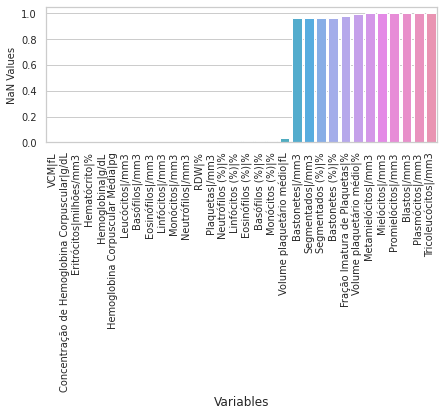

In [ ]:
plt.figure(figsize = (7,2.5))

sns.set(style="whitegrid", color_codes=True, font_scale=0.9)
sns.barplot(x = 'Variables', y = 'NaN Values', data=missing_values)
plt.xticks(rotation = 90)
plt.xlabel( "Variables" , size = 12 ) 
plt.ylabel( "NaN Values" , size = 10 )
#plt.title( "Missing values for the dataset" , size = 8 ) 
#plt.savefig('VALORES_AUSENTES.png', format='png')
plt.show()

In [ ]:
percent_missing = df_am.isnull().sum() * 100 / len(df_am)
missing_value_df = pd.DataFrame({'Colunas': df_am.columns,
                                 'Valores ausentes (%)': percent_missing})

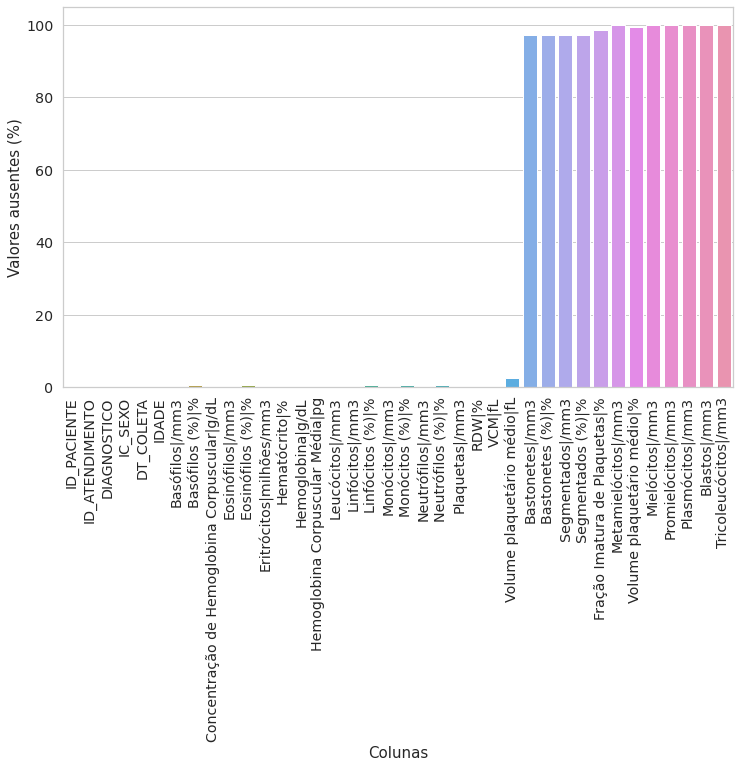

In [ ]:
plt.figure(figsize = (12,7))

sns.set(style="whitegrid", color_codes=True, font_scale=1.3)
sns.barplot(x = 'Colunas', y = 'Valores ausentes (%)', data=missing_value_df)
plt.xticks(rotation = 90)
plt.xlabel( "Colunas" , size = 15 ) 
plt.ylabel( "Valores ausentes (%)" , size = 15 )
#plt.title( "Missing values for the dataset" , size = 8 ) 
#plt.savefig('VALORES_AUSENTES.png', format='png')
#plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns
import pandas as pd
import missingno as msno
%matplotlib inline

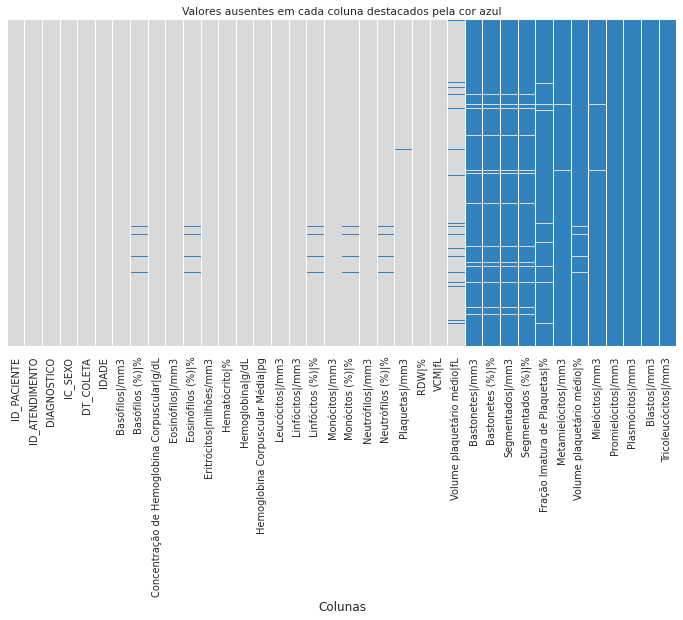

In [ ]:
plt.figure(figsize = (12,6)) # o que aparece em azul são valores ausentes
sns.heatmap(fleury_am.isnull(),yticklabels = False, cbar = False,cmap = 'tab20c_r')
plt.title('Valores ausentes em cada coluna destacados pela cor azul')
plt.xlabel( "Colunas" , size = 12 ) 

#plt.show()
plt.savefig('VALORES_AUSENTES_FLEURY.png', format='png')


<font color='blue'> A partir da informação exposta acima, pode-se excluir analitos com grande presença de valores ausentes.




PLOTANDO HISTOGRAMAS

In [ ]:
new_df_fleury_1 = fleury_am.drop(columns=['Tricoleucócitos|/mm3', 'Blastos|/mm3',
                                        'Plasmócitos|/mm3', 'Promielócitos|/mm3',
                                        'Mielócitos|/mm3', 'Volume plaquetário médio|%',
                                         'Metamielócitos|/mm3', 'Fração Imatura de Plaquetas|%',
                                        'Segmentados (%)|%', 'Segmentados|/mm3',
                                        'Bastonetes (%)|%', 'Bastonetes|/mm3',
                                        'ID_ATENDIMENTO', 'ID_PACIENTE', 'DT_COLETA', 'IC_SEXO', 'IDADE'])

In [ ]:
import seaborn as sns
from sklearn import datasets

In [ ]:
preencher_ausentes = new_df_fleury_1.median()
new_df_fleury_1.fillna(preencher_ausentes, inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


In [ ]:
#neg = new_df_fleury_1(new_df_fleury_1['DIAGNOSTICO'] == 'NEGATIVO')
#pos = new_df_fleury_1(new_df_fleury_1['DIAGNOSTICO'] == 'POSITIVO')

#x = new_df_fleury_1['Eosinófilos (%)|%'].neg
#y = new_df_fleury_1['Eosinófilos (%)|%'].pos

In [ ]:
new_df_fleury_1

,DIAGNOSTICO,Basófilos|/mm3,Basófilos (%)|%,Concentração de Hemoglobina Corpuscular|g/dL,Eosinófilos|/mm3,Eosinófilos (%)|%,Eritrócitos|milhões/mm3,Hematócrito|%,Hemoglobina|g/dL,Hemoglobina Corpuscular Média|pg,...,Linfócitos|/mm3,Linfócitos (%)|%,Monócitos|/mm3,Monócitos (%)|%,Neutrófilos|/mm3,Neutrófilos (%)|%,Plaquetas|/mm3,RDW|%,VCM|fL,Volume plaquetário médio|fL
0,NEGATIVO,10.0,0.1,33.8,30.0,0.4,4.16,35.2,11.9,28.6,...,1050.0,12.3,630.0,7.4,6820.0,79.8,265000.0,13.2,84.6,11.2
1,NEGATIVO,10.0,0.1,34.0,20.0,0.3,4.38,37.1,12.6,28.8,...,1650.0,22.9,450.0,6.2,5080.0,70.5,275000.0,13.1,84.7,11.1
2,NEGATIVO,50.0,0.9,33.1,280.0,5.2,4.63,46.5,15.4,33.3,...,1630.0,30.5,560.0,10.5,2830.0,52.9,257000.0,12.1,100.4,11.5
3,NEGATIVO,30.0,0.6,32.9,200.0,3.9,4.82,46.8,15.4,32.0,...,1410.0,27.5,630.0,12.3,2860.0,55.7,286000.0,12.7,97.1,10.7
4,NEGATIVO,30.0,0.5,32.5,280.0,5.0,4.63,45.8,14.9,32.2,...,1380.0,24.9,600.0,10.8,3260.0,58.8,288000.0,13.2,98.9,10.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
365202,POSITIVO,20.0,0.4,34.1,20.0,0.4,3.90,34.9,11.9,30.5,...,1440.0,26.6,350.0,6.5,3580.0,66.1,217000.0,12.5,89.5,10.1
365203,POSITIVO,50.0,1.1,32.3,70.0,1.5,3.59,33.4,10.8,30.1,...,1210.0,26.5,250.0,5.5,2990.0,65.4,209000.0,12.8,93.0,10.6
365204,POSITIVO,40.0,0.7,33.7,50.0,0.8,4.27,39.5,13.3,31.1,...,1550.0,25.3,350.0,5.7,4130.0,67.5,219000.0,13.2,92.5,10.3
365205,NEGATIVO,40.0,0.5,33.0,70.0,0.9,5.10,44.3,14.6,28.6,...,2070.0,26.3,930.0,11.8,4770.0,60.5,355000.0,13.0,86.9,11.0


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-deep')

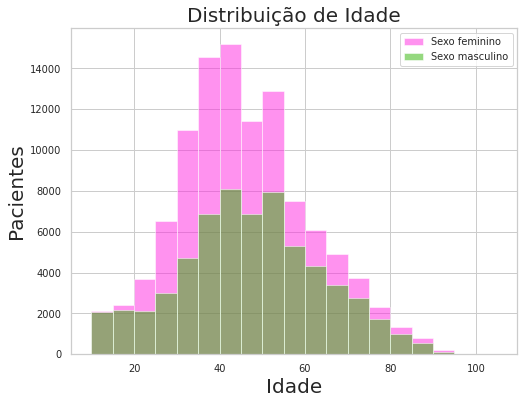

In [ ]:
fem = df_am[df_am.IC_SEXO == 1] #sexo feminino
mas = df_am[df_am.IC_SEXO == 0] #sexo masculino
idade_fem = fem['IDADE']
idade_mas = mas['IDADE']
plt.rcParams['font.size'] = '20'
plt.figure(figsize=(8, 6))
plt.title('Distribuição de Idade', fontsize=20)
plt.xlabel('Idade', fontsize=20)
plt.ylabel('Pacientes', fontsize=20)
plt.hist(idade_fem, bins=range(10, 110,5),
         alpha=0.5, label='Sexo feminino', color='#FF26E1')
plt.hist(idade_mas, bins=range(10, 110,5),
         alpha=0.5, label='Sexo masculino', color='#2DB200')
plt.legend(loc='upper right')

plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20

plt.show()

In [ ]:
fleury_am.describe()

,IC_SEXO,IDADE,Basófilos|/mm3,Basófilos (%)|%,Concentração de Hemoglobina Corpuscular|g/dL,Eosinófilos|/mm3,Eosinófilos (%)|%,Eritrócitos|milhões/mm3,Hematócrito|%,Hemoglobina|g/dL,...,Segmentados|/mm3,Segmentados (%)|%,Fração Imatura de Plaquetas|%,Metamielócitos|/mm3,Volume plaquetário médio|%,Mielócitos|/mm3,Promielócitos|/mm3,Plasmócitos|/mm3,Blastos|/mm3,Tricoleucócitos|/mm3
count,365207.000000,365207.000000,365190.000000,361384.000000,365196.000000,365190.000000,361384.000000,365196.000000,365196.000000,365196.000000,...,13781.000000,13662.000000,8033.000000,1361.000000,3676.000000,1098.000000,243.000000,64.000000,161.000000,1.0
mean,0.645847,47.059410,40.673266,0.640178,33.607308,178.899170,2.781319,4.638158,40.750103,13.700685,...,4518.320877,54.092966,5.834184,366.238060,10.421681,369.990893,342.427984,230.312500,1532.111801,140.0
std,0.478256,17.100968,33.818351,0.345160,1.119797,216.496857,2.313159,0.537826,4.141499,1.508919,...,3587.565357,15.105141,5.130157,819.356517,0.885094,925.559921,862.024974,585.431516,4149.586638,NaN
min,0.000000,1.000000,0.000000,0.000000,23.300000,0.000000,0.000000,1.330000,13.900000,4.200000,...,30.000000,1.000000,0.200000,10.000000,7.800000,10.000000,20.000000,20.000000,20.000000,140.0
25%,0.000000,36.000000,30.000000,0.400000,32.900000,80.000000,1.300000,4.300000,38.100000,12.800000,...,2380.000000,44.900000,2.600000,100.000000,9.800000,100.000000,70.000000,50.000000,60.000000,140.0
50%,1.000000,46.000000,40.000000,0.600000,33.600000,140.000000,2.200000,4.620000,40.600000,13.600000,...,3560.000000,54.900000,4.400000,190.000000,10.300000,180.000000,140.000000,70.000000,170.000000,140.0
75%,1.000000,58.000000,50.000000,0.800000,34.300000,220.000000,3.500000,4.980000,43.400000,14.700000,...,5400.000000,64.400000,7.300000,350.000000,11.000000,330.000000,305.000000,90.000000,460.000000,140.0
max,1.000000,91.000000,8070.000000,13.100000,39.700000,42210.000000,85.400000,8.280000,71.500000,23.900000,...,78110.000000,96.000000,55.300000,17750.000000,13.300000,15980.000000,9850.000000,3300.000000,25880.000000,140.0


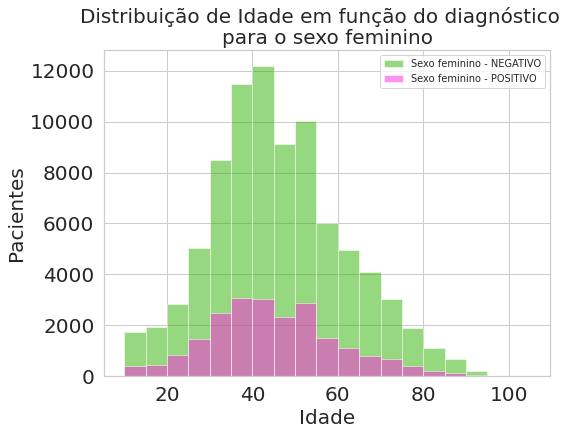

In [ ]:
sexo = df_am[df_am.IC_SEXO == 1]
positivo = sexo[sexo.DIAGNOSTICO == 'POSITIVO'] #sexo feminino
negativo = sexo[sexo.DIAGNOSTICO == 'NEGATIVO'] #sexo masculino
positivo_fem = positivo['IDADE']
negativo_fem = negativo['IDADE']
plt.figure(figsize=(8, 6))
plt.suptitle('Distribuição de Idade em função do diagnóstico', fontsize=20)
plt.title('para o sexo feminino', fontsize=20)
plt.xlabel('Idade', fontsize=20)
plt.ylabel('Pacientes', fontsize=20)
plt.hist(negativo_fem, bins=range(10, 110,5),
         alpha=0.5, label='Sexo feminino - NEGATIVO', color='#2DB200')
plt.hist(positivo_fem, bins=range(10, 110,5),
         alpha=0.5, label='Sexo feminino - POSITIVO', color='#FF26E1')
plt.legend(loc='upper right')

plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16

plt.show()

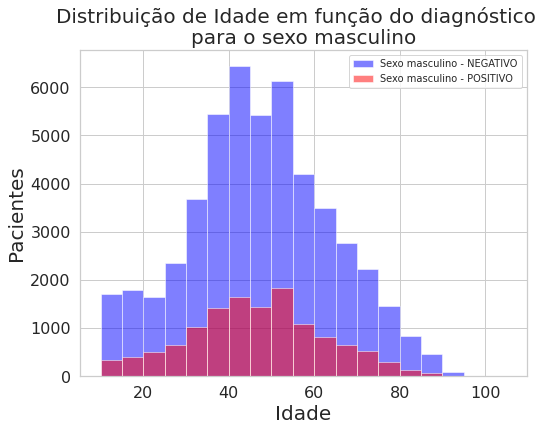

In [ ]:
sexo_m = df_am[df_am.IC_SEXO == 0]
positivo = sexo_m[sexo_m.DIAGNOSTICO == 'POSITIVO'] #sexo feminino
negativo = sexo_m[sexo_m.DIAGNOSTICO == 'NEGATIVO'] #sexo masculino
positivo_mas = positivo['IDADE']
negativo_mas = negativo['IDADE']
plt.figure(figsize=(8, 6))
plt.suptitle('Distribuição de Idade em função do diagnóstico', fontsize=20)
plt.title('para o sexo masculino', fontsize=20)

plt.xlabel('Idade', fontsize=20)
plt.ylabel('Pacientes', fontsize=20)
plt.hist(negativo_mas, bins=range(10, 110,5),
         alpha=0.5, label='Sexo masculino - NEGATIVO', color='blue')
plt.hist(positivo_mas, bins=range(10, 110,5),
         alpha=0.5, label='Sexo masculino - POSITIVO', color='red')
plt.legend(loc='upper right')
plt.show()

<font color='blue'> Gerando novo dataset excluindo os analitos com valores ausentes





In [ ]:
new_df_fleury = df_am.drop(columns=['Tricoleucócitos|/mm3', 'Blastos|/mm3',
                                        'Plasmócitos|/mm3', 'Promielócitos|/mm3',
                                        'Mielócitos|/mm3', 'Volume plaquetário médio|%',
                                         'Metamielócitos|/mm3', 'Fração Imatura de Plaquetas|%',
                                        'Segmentados (%)|%', 'Segmentados|/mm3',
                                        'Bastonetes (%)|%', 'Bastonetes|/mm3'])

<font color='blue'> Preencimento do dataset com mediana. Esta abordagem foi adotada devido à pouca quantidde de valores ausentes

In [ ]:
fem = df_am[df_am.IC_SEXO == 1] #sexo feminino
mas = df_am[df_am.IC_SEXO == 0] #sexo masculino
fem_1 = fem['DIAGNOSTICO']=='POSITIVO'
fem_2 = fem['DIAGNOSTICO']=='NEGATIVO'

mas_1 = mas['DIAGNOSTICO'] =='POSITIVO'
mas_2 = mas['DIAGNOSTICO'] =='NEGATIVO'

In [ ]:
new_df_fleury.info()

In [ ]:
#VERIFICANDO O COMPORTAMENTO DAS VARIÁVEIS EM FUNÇÃO DO DIAGNÓSTICO

In [ ]:
dispercao_fleury = new_df_fleury.drop(columns=['ID_PACIENTE', 'ID_ATENDIMENTO', 'IC_SEXO']) 

In [ ]:
! pip install sweetviz

In [ ]:
import sweetviz as sv

In [ ]:
#relatorio_fleury = sv.analyze(dispercao_fleury)
#relatorio_fleury.show_html()

In [ ]:
dispercao_fleury

In [ ]:
dispercao_fleury=dispercao_fleury.fillna(dispercao_fleury.median())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


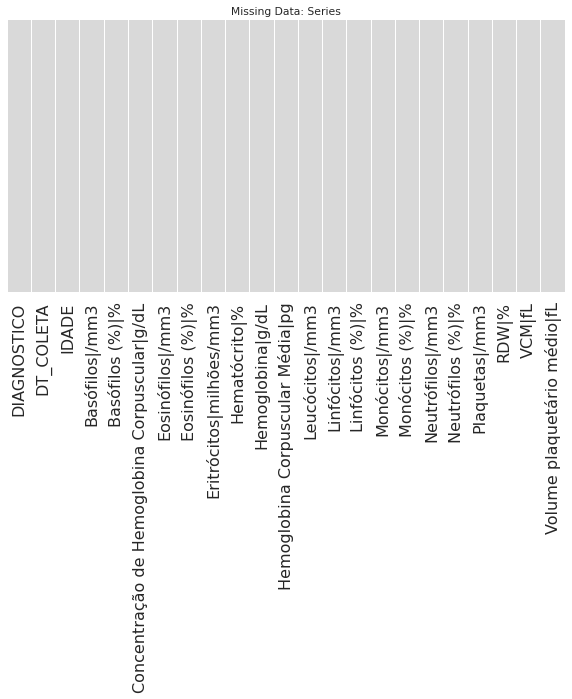

In [ ]:
plt.figure(figsize = (10,5)) # o que aparece em azul são valores ausentes
sns.heatmap(dispercao_fleury.isnull(),yticklabels = False, cbar = False,cmap = 'tab20c_r')
plt.title('Missing Data: Series')
#plt.show()
plt.savefig('VALORES_AUSENTES_FLEURY_PREENCHIMENTO.png', format='png')

In [ ]:
dispercao_fleury.to_csv('fleury_completo.csv', index=False)

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
positivos = ['POSITIVO']
POSITIVO = dispercao_fleury[dispercao_fleury.DIAGNOSTICO.isin(positivos)]

negativo = ['NEGATIVO']
NEGATIVO = dispercao_fleury[dispercao_fleury.DIAGNOSTICO.isin(negativo)]

In [ ]:
plt.figure(figsize = (2.5,1))
plt.title("Basófilos|mm3")
plt.yticks(fontsize=7)
plt.title('Basófilos|/mm3', fontsize=7);
ax = sns.boxplot(x="Basófilos|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Basófilos (%)|%")
ax = sns.boxplot(x="Basófilos (%)|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Concentração Hemoglobina")
ax = sns.boxplot(x="Concentração de Hemoglobina Corpuscular|g/dL", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Eosinófilos|/mm3")
ax = sns.boxplot(x="Eosinófilos|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Eosinófilos (%)|%")
ax = sns.boxplot(x="Eosinófilos (%)|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Eritrócitos|milhões/mm3")
ax = sns.boxplot(x="Eritrócitos|milhões/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Hematócrito|%")
ax = sns.boxplot(x="Hematócrito|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)


plt.figure(figsize = (2.5,1))
plt.title("Hemoglobina|g/dL")
ax = sns.boxplot(x="Hemoglobina|g/dL", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Hemoglobina Corpuscular Média|pg")
ax = sns.boxplot(x="Hemoglobina Corpuscular Média|pg", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Leucócitos|/mm3")
ax = sns.boxplot(x="Leucócitos|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Linfócitos|/mm3")
ax = sns.boxplot(x="Linfócitos|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)


plt.figure(figsize = (2.5,1))
plt.title("Linfócitos (%)|%")
ax = sns.boxplot(x="Linfócitos (%)|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Monócitos|/mm3")
ax = sns.boxplot(x="Monócitos|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)


plt.figure(figsize = (2.5,1))
plt.title("Monócitos (%)|%")
ax = sns.boxplot(x="Monócitos (%)|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Neutrófilos|/mm3")
ax = sns.boxplot(x="Neutrófilos|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Neutrófilos (%)|%")
ax = sns.boxplot(x="Neutrófilos (%)|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Plaquetas|/mm3")
ax = sns.boxplot(x="Plaquetas|/mm3", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("RDW|%")
ax = sns.boxplot(x="RDW|%", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("VCM|fL")
ax = sns.boxplot(x="VCM|fL", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.figure(figsize = (2.5,1))
plt.title("Volume plaquetário médio|fL")
ax = sns.boxplot(x="Volume plaquetário médio|fL", y="DIAGNOSTICO", data=dispercao_fleury, width=0.9, linewidth=0.5, fliersize=3, whis=3)

plt.show()


In [ ]:
dispercao_fleury.info()

In [ ]:
dados_1 = dispercao_fleury.loc[:,['IDADE', 'Concentração de Hemoglobina Corpuscular|g/dL', 'Hematócrito|%',
                                  'Linfócitos (%)|%','Monócitos (%)|%', 'Neutrófilos (%)|%','RDW|%', 'VCM|fL','Volume plaquetário médio|fL']]
dados_2 = dispercao_fleury.loc[:,['Basófilos|/mm3','Eosinófilos|/mm3', 'Monócitos|/mm3']]
dados_3 = dispercao_fleury.loc[:,['Basófilos (%)|%', 'Eosinófilos (%)|%', 'Eritrócitos|milhões/mm3']]
dados_4 = dispercao_fleury.loc[:,['Neutrófilos|/mm3', 'Linfócitos|/mm3', 'Plaquetas|/mm3']]

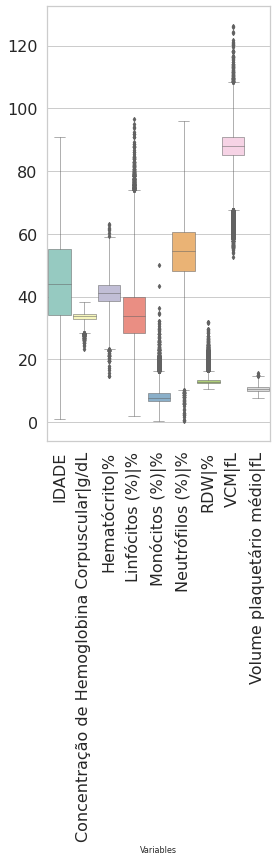

In [ ]:
plt.figure(figsize = (4,8))
plt.xticks(rotation = 90)
plt.xlabel( "Variables" , size = 8 ) 
#plt.title( "Boxplot para os valores" , size = 8 ) 
axes = plt.gca()
ymin=0
ymax=280000
#axes.set_ylim([ymin,ymax])
ax = sns.boxplot(data=dados_1, orient="v", palette="Set3", width=0.9, linewidth=0.5, fliersize=3, whis=3)

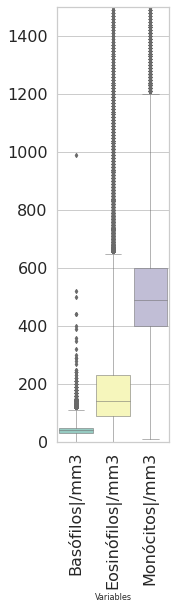

In [ ]:
plt.figure(figsize = (2,8))
plt.xticks(rotation = 90)
plt.xlabel( "Variables" , size = 8 ) 
#plt.title( "Boxplot para os valores" , size = 8 ) 
axes = plt.gca()
ymin=0
ymax=1500
axes.set_ylim([ymin,ymax])
ax = sns.boxplot(data=dados_2, orient="v", palette="Set3", width=0.9, linewidth=0.5, fliersize=3, whis=3)

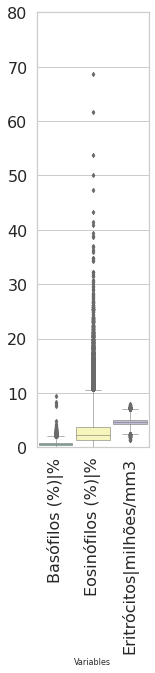

In [ ]:
plt.figure(figsize = (2,8))
plt.xticks(rotation = 90)
plt.xlabel( "Variables" , size = 8 ) 
#plt.title( "Boxplot para os valores" , size = 8 ) 
axes = plt.gca()
ymin=0
ymax=80
axes.set_ylim([ymin,ymax])
ax = sns.boxplot(data=dados_3, orient="v", palette="Set3", width=0.9, linewidth=0.5, fliersize=3, whis=3)

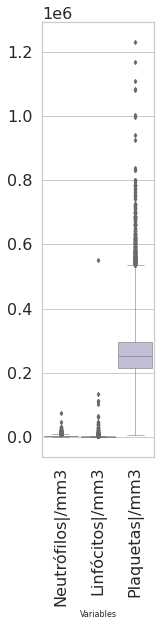

In [ ]:
plt.figure(figsize = (2,8))
plt.xticks(rotation = 90)
plt.xlabel( "Variables" , size = 8 ) 
#plt.title( "Boxplot para os valores" , size = 8 ) 
axes = plt.gca()
ymin=0
ymax=80
#axes.set_ylim([ymin,ymax])
ax = sns.boxplot(data=dados_4, orient="v", palette="Set3", width=0.9, linewidth=0.5, fliersize=3, whis=3)

<font color='blue'> Devido à grande quantidade de outliers em todos os analitos selecionados, opetou-se por não realizar nenhum tratamento, visto que é necessário o auxílio de especilista para anlisar as características clínicas destes valores. Contudo, vale destacar que este comportamento não é adequado para tarefas de aprendizado de máquina, denotado ainda mais a necessidade de um maior controle sobre a coleta de dados. 



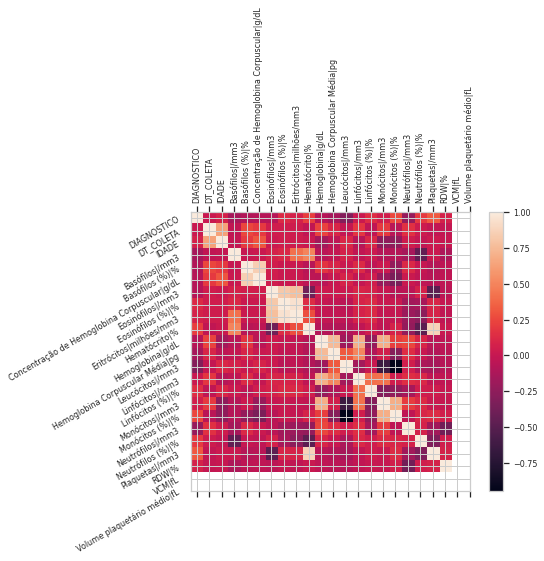

In [ ]:
f = plt.figure(figsize=(7, 5))
plt.matshow(dispercao_fleury.corr(), fignum=f.number)
plt.xticks(range(dispercao_fleury.shape[1]), dispercao_fleury.columns, fontsize=8, rotation=90)
plt.yticks(range(dispercao_fleury.shape[1]), dispercao_fleury.columns, fontsize=8,  rotation=30)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=8)
#plt.title('Correlation Matrix', fontsize=16);

In [ ]:
!pip install pandas=='1.0'

In [ ]:
import pandas_profiling
from pandas_profiling import ProfileReport

In [ ]:
positivos = ['POSITIVO']
POSITIVO = dispercao_fleury[dispercao_fleury.DIAGNOSTICO.isin(positivos)]

negativo = ['NEGATIVO']
NEGATIVO = dispercao_fleury[dispercao_fleury.DIAGNOSTICO.isin(negativo)]

In [ ]:
X=POSITIVO['Basófilos (%)|%']
Y=NEGATIVO['Basófilos (%)|%']

In [ ]:
from bokeh.plotting import figure
from bokeh.io import output_notebook, show


In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
pandas_profiling.ProfileReport(dispercao_fleury)

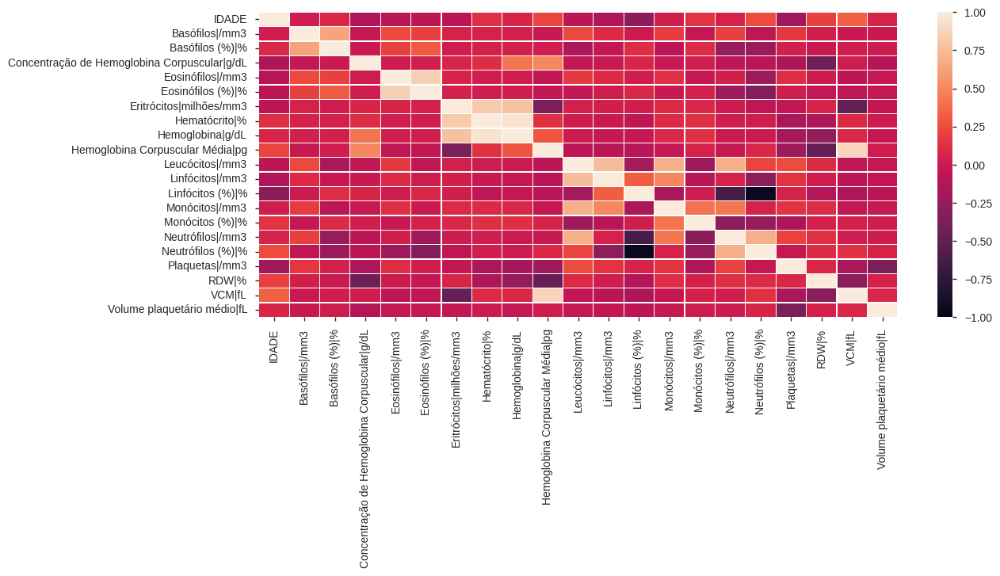

In [ ]:
plt.figure(figsize = (13,5))
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
sns.heatmap(dispercao_fleury.corr(), annot=False,vmin=-1, vmax=1, linewidths=.1)

In [ ]:
#fleury_pair_plot = dispercao_fleury.drop(columns=['Eosinófilos|/mm3', 'Basófilos|/mm3', 'Hematócrito|%', 'IDADE', 'Volume plaquetário médio|fL'])
fleury_pair_plot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174640 entries, 221886 to 329344
Data columns (total 18 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   DIAGNOSTICO                                   174640 non-null  object 
 1   DT_COLETA                                     174640 non-null  object 
 2   Basófilos (%)|%                               174640 non-null  float64
 3   Concentração de Hemoglobina Corpuscular|g/dL  174640 non-null  float64
 4   Eosinófilos (%)|%                             174640 non-null  float64
 5   Eritrócitos|milhões/mm3                       174640 non-null  float64
 6   Hemoglobina|g/dL                              174640 non-null  float64
 7   Hemoglobina Corpuscular Média|pg              174640 non-null  float64
 8   Leucócitos|/mm3                               174640 non-null  float64
 9   Linfócitos|/mm3                            

In [ ]:
fleury_pair_plot = fleury_pair_plot.drop(columns=['Concentração de Hemoglobina Corpuscular|g/dL', 'Hemoglobina Corpuscular Média|pg'])

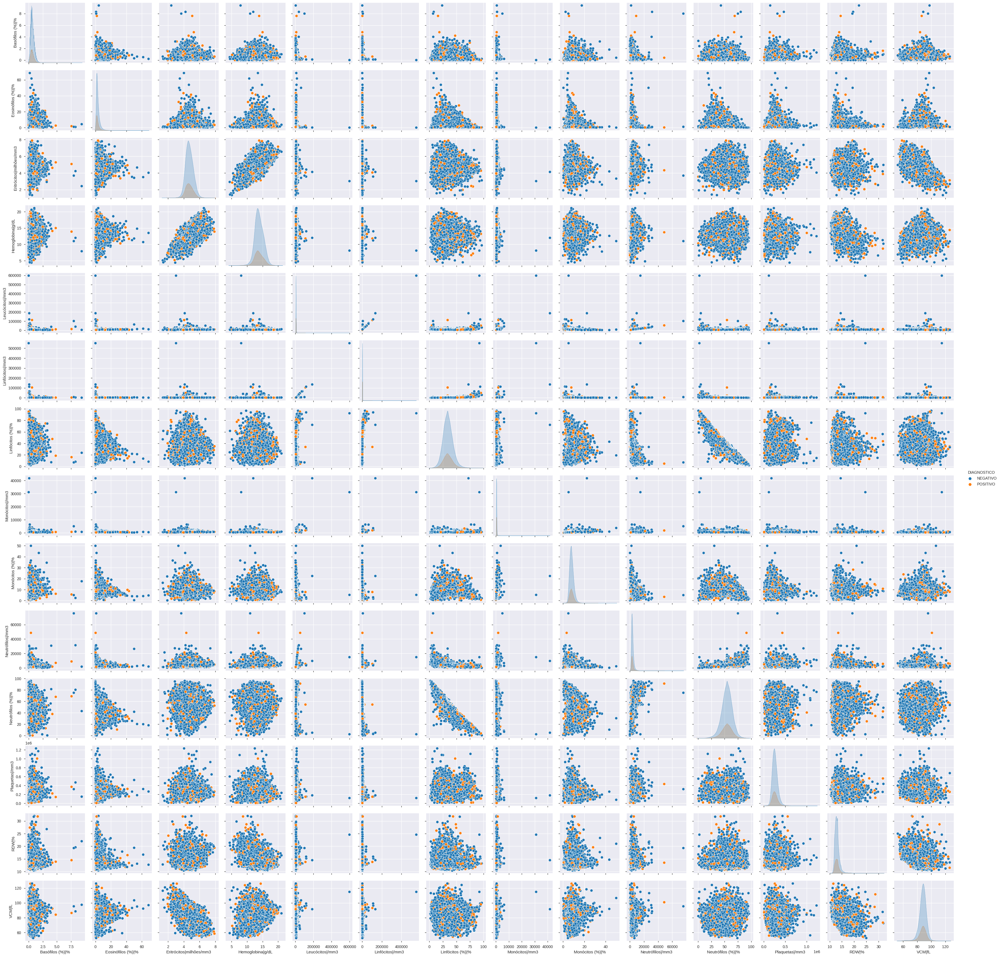

In [ ]:
sns.pairplot(fleury_pair_plot, hue="DIAGNOSTICO")

**ETAPA DE APRENDIZADO DE MÁQUINA**

In [ ]:
#REDUZINDO DIMENSIONALIDADE

new_df_fleury_1['DIAGNOSTICO'].value_counts()

NEGATIVO    285624
POSITIVO     79583
Name: DIAGNOSTICO, dtype: int64

In [ ]:
new_df_fleury_1_p= new_df_fleury_1.loc[new_df_fleury_1['DIAGNOSTICO'] == 'POSITIVO'] 
new_df_fleury_1_n= new_df_fleury_1.loc[new_df_fleury_1['DIAGNOSTICO'] == 'NEGATIVO']

In [ ]:
 new_df_fleury_1_p=new_df_fleury_1_p.iloc[0:1000] # SELECIONANDO 3500 PACIENTES NEGATIVOS
new_df_fleury_1_n = new_df_fleury_1_n.iloc[0:3500]  #SELECIONADO 1000 PACIENTES POSITIOVOS. CONSIDEROU-SE A PROPORÇÃO ENTRE OS GRUPOS

In [ ]:
fleury_am = pd.concat([new_df_fleury_1_p, new_df_fleury_1_n])


In [ ]:
fleury_am['DIAGNOSTICO'].value_counts()

NEGATIVO    3500
POSITIVO    1000
Name: DIAGNOSTICO, dtype: int64

In [ ]:
import seaborn as sns
import math
import datetime as dt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression, SelectKBest, SelectPercentile
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
df_am_ajustado = fleury_am
d_2 = {'POSITIVO' : 1, 'NEGATIVO':0}
df_am_ajustado['DIAGNOSTICO'] = df_am_ajustado['DIAGNOSTICO'].map(d_2) #colocando 0 e 1 na coluna target
df_am_ajustado.head()

In [ ]:
from sklearn import preprocessing


In [ ]:
cols = df_am_ajustado.columns     #NORMALIZAÇÃO DOS DADOS
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(df_am_ajustado)
novos_dados = pd.DataFrame(np_scaled, columns = cols)
novos_dados = novos_dados.fillna(novos_dados.median())
novos_dados

,DIAGNOSTICO,Basófilos|/mm3,Basófilos (%)|%,Concentração de Hemoglobina Corpuscular|g/dL,Eosinófilos|/mm3,Eosinófilos (%)|%,Eritrócitos|milhões/mm3,Hematócrito|%,Hemoglobina|g/dL,Hemoglobina Corpuscular Média|pg,...,Linfócitos|/mm3,Linfócitos (%)|%,Monócitos|/mm3,Monócitos (%)|%,Neutrófilos|/mm3,Neutrófilos (%)|%,Plaquetas|/mm3,RDW|%,VCM|fL,Volume plaquetário médio|fL
0,1.0,0.00813,0.076923,0.521739,0.008264,0.015385,0.528184,0.568966,0.584,0.461847,...,0.084084,0.360864,0.087935,0.198646,0.022109,0.562420,0.075423,0.068027,0.470313,0.761905
1,1.0,0.03252,0.346154,0.652174,0.090909,0.180769,0.521921,0.543103,0.600,0.485944,...,0.083483,0.385006,0.067485,0.164786,0.018272,0.492921,0.130039,0.095238,0.450000,0.428571
2,1.0,0.00813,0.076923,0.630435,0.033058,0.065385,0.563674,0.609195,0.656,0.493976,...,0.084685,0.378653,0.110429,0.259594,0.018911,0.492921,0.101430,0.095238,0.467187,0.523810
3,1.0,0.01626,0.153846,0.554348,0.115702,0.242308,0.336117,0.376437,0.416,0.522088,...,0.093093,0.449809,0.085890,0.216704,0.013795,0.383526,0.117035,0.142857,0.526562,0.396825
4,1.0,0.04878,0.269231,0.673913,0.326446,0.369231,0.440501,0.511494,0.576,0.562249,...,0.109309,0.264295,0.134969,0.180587,0.038462,0.545689,0.295189,0.054422,0.531250,0.476190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4495,0.0,0.02439,0.230769,0.608696,0.086777,0.153846,0.517745,0.548851,0.592,0.481928,...,0.134535,0.537484,0.104294,0.221219,0.014709,0.319176,0.202861,0.142857,0.462500,0.396825
4496,0.0,0.01626,0.153846,0.597826,0.053719,0.107692,0.409186,0.330460,0.384,0.381526,...,0.076877,0.362135,0.067485,0.167043,0.019551,0.545689,0.269181,0.251701,0.350000,0.539683
4497,0.0,0.01626,0.153846,0.565217,0.066116,0.130769,0.463466,0.433908,0.472,0.417671,...,0.090691,0.409149,0.075665,0.180587,0.018272,0.482625,0.228869,0.156463,0.401562,0.507937
4498,0.0,0.00813,0.076923,0.543478,0.053719,0.115385,0.465553,0.413793,0.448,0.389558,...,0.092492,0.467598,0.063395,0.169300,0.014709,0.437580,0.254876,0.176871,0.375000,0.460317


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(novos_dados.drop(['DIAGNOSTICO'], axis=1), novos_dados['DIAGNOSTICO'],
                                                    test_size = 0.3, random_state=0)
print('Dados de treino {}'.format(X_train.shape))
print('\n')
print("Dados de teste{}". format(X_test.shape))

Dados de treino (3150, 20)


Dados de teste(1350, 20)


In [ ]:
#VALIDAÇÃO CRUZADA

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.feature_selection import VarianceThreshold, SelectKBest
from sklearn.decomposition import PCA

from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import make_scorer

In [ ]:
# Semente aleatória para reproducibilidade dos experimentos (reproducão dos experimentos)
seed = 20

APRENDIZADO AUC

In [ ]:
scorer = make_scorer(accuracy_score) # Teste outras

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)


gscv = StratifiedKFold(n_splits=3, shuffle=True, random_state=seed)

algorithms = {
    # testar sem hiperparâmetros
    'kNN':  GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', MinMaxScaler(feature_range=(0, 1))),
            ('selector', VarianceThreshold()),
            ('knn', KNeighborsClassifier())]), 
        param_grid={
            'selector__threshold': [0, 0.01, 0.02, 0.03],
            'knn__n_neighbors': [1, 3, 5],
            'knn__p': [1, 2],
        },
        scoring=scorer,
        cv=gscv),
    'tree':  GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('tree', DecisionTreeClassifier(random_state=seed))]), 
        param_grid={
            'tree__max_depth': [5, 10, 20],
            'tree__criterion': ['entropy', 'gini'],
        },
        scoring=scorer,
        cv=gscv),
    'bigtree':  GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('tree', DecisionTreeClassifier(max_depth=None, min_samples_split=2, random_state=seed))]), 
        param_grid={
            'tree__criterion': ['entropy', 'gini'],
        },
        scoring=scorer,
        cv=gscv),
    'svmlinear': GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler()),
            ('pca', PCA()),
            ('svm', SVC(kernel='linear', random_state=seed))]), 
        param_grid={
            'pca__n_components': [2, 5, 10],
            'svm__C': [1.0, 2.0],
        },
        scoring=scorer,
        cv=gscv),
    'svmrbf': GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler()),
            ('pca', PCA(random_state=seed)),
            ('svm', SVC(kernel='rbf', random_state=seed))]), 
        param_grid={
            'pca__n_components': [2, 5, 10],
            'svm__C': [1.0, 2.0],
            'svm__gamma': [0.1, 1.0, 2.0],
        },
        scoring=scorer,
        cv=gscv),
}

In [ ]:
from sklearn.model_selection import cross_val_score

result = {}
for alg, clf in algorithms.items():
  result[alg] = cross_val_score(clf, X_train, y_train, cv=cv)

result = pd.DataFrame.from_dict(result)

In [ ]:
print(result)

        kNN      tree   bigtree  svmlinear    svmrbf
0  0.774603  0.777778  0.587302   0.784127  0.784127
1  0.758730  0.777778  0.685714   0.784127  0.780952
2  0.758730  0.780952  0.704762   0.784127  0.784127
3  0.761905  0.768254  0.622222   0.784127  0.784127
4  0.755556  0.774603  0.701587   0.784127  0.787302
5  0.806349  0.787302  0.666667   0.784127  0.784127
6  0.746032  0.765079  0.669841   0.784127  0.784127
7  0.752381  0.780952  0.650794   0.784127  0.790476
8  0.780952  0.787302  0.711111   0.780952  0.780952
9  0.761905  0.787302  0.704762   0.780952  0.777778


In [ ]:
result.apply(lambda x: "{:.2f} ± {:.2f}".format(x.mean(), x.std()))

kNN          0.77 ± 0.02
tree         0.78 ± 0.01
bigtree      0.67 ± 0.04
svmlinear    0.78 ± 0.00
svmrbf       0.78 ± 0.00
dtype: object

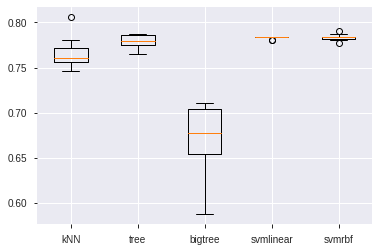

In [ ]:
import matplotlib.pyplot as plt

plt.boxplot([ scores for alg, scores in result.iteritems() ])
plt.xticks(1 + np.arange(result.shape[1]), result.columns)
plt.show()

COMPARANDO DESEPENHO

In [ ]:
from scipy.stats import wilcoxon

In [ ]:
# Comparar dois algoritmos:

wilcoxon(result.kNN, result.svmlinear)

/usr/local/lib/python3.7/dist-packages/scipy/stats/morestats.py:2879: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


WilcoxonResult(statistic=3.5, pvalue=0.02414053862843877)

APRENDIZADO F1 SCORE

In [ ]:
scorer = make_scorer(accuracy_score) # Teste outras

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)


gscv = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)

algorithmo = {
    # testar sem hiperparâmetros
    'kNN':  GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', MinMaxScaler(feature_range=(0, 1))),
            ('selector', VarianceThreshold()),
            ('knn', KNeighborsClassifier())]), 
        param_grid={
            'selector__threshold': [0, 0.01, 0.02, 0.03],
            'knn__n_neighbors': [1, 3, 5],
            'knn__p': [1, 2],
        },
        scoring='f1',
        cv=gscv),
    'tree':  GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('tree', DecisionTreeClassifier(random_state=seed))]), 
        param_grid={
            'tree__max_depth': [5, 10, 20],
            'tree__criterion': ['entropy', 'gini'],
        },
        scoring='f1',
        cv=gscv),
    'bigtree':  GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('tree', DecisionTreeClassifier(max_depth=None, min_samples_split=2, random_state=seed))]), 
        param_grid={
            'tree__criterion': ['entropy', 'gini'],
        },
        scoring='f1',
        cv=gscv),
    'svmlinear': GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler()),
            ('pca', PCA()),
            ('svm', SVC(kernel='linear', random_state=seed))]), 
        param_grid={
            'pca__n_components': [2, 5, 10],
            'svm__C': [1.0, 2.0],
        },
        scoring='f1',
        cv=gscv),
    'svmrbf': GridSearchCV(
        Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler()),
            ('pca', PCA(random_state=seed)),
            ('svm', SVC(kernel='rbf', random_state=seed))]), 
        param_grid={
            'pca__n_components': [2, 5, 10],
            'svm__C': [1.0, 2.0],
            'svm__gamma': [0.1, 1.0, 2.0],
        },
        scoring='f1',
        cv=gscv),
}

In [ ]:
from sklearn.model_selection import cross_val_score

resultes = {}
for alg, clf in algorithmo.items():
  resultes[alg] = cross_val_score(clf, X_train, y_train, cv=cv)

resultes = pd.DataFrame.from_dict(resultes)
print(resultes)

In [ ]:
resultes.apply(lambda x: "{:.2f} ± {:.2f}".format(x.mean(), x.std())) #bigtree é arvore de decisão

kNN          0.35 ± 0.07
tree         0.27 ± 0.05
bigtree      0.28 ± 0.05
svmlinear    0.00 ± 0.00
svmrbf       0.13 ± 0.05
dtype: object

In [ ]:
fleury_pair_plot_1['DIAGNOSTICO'].value_counts()

0    3500
1    1000
Name: DIAGNOSTICO, dtype: int64

In [ ]:
fleury_pair_plot_1 = fleury_am.drop(columns=['Eosinófilos|/mm3', 'Basófilos|/mm3', 'Hematócrito|%', 'Volume plaquetário médio|fL', 'Concentração de Hemoglobina Corpuscular|g/dL', 'Hemoglobina Corpuscular Média|pg'])


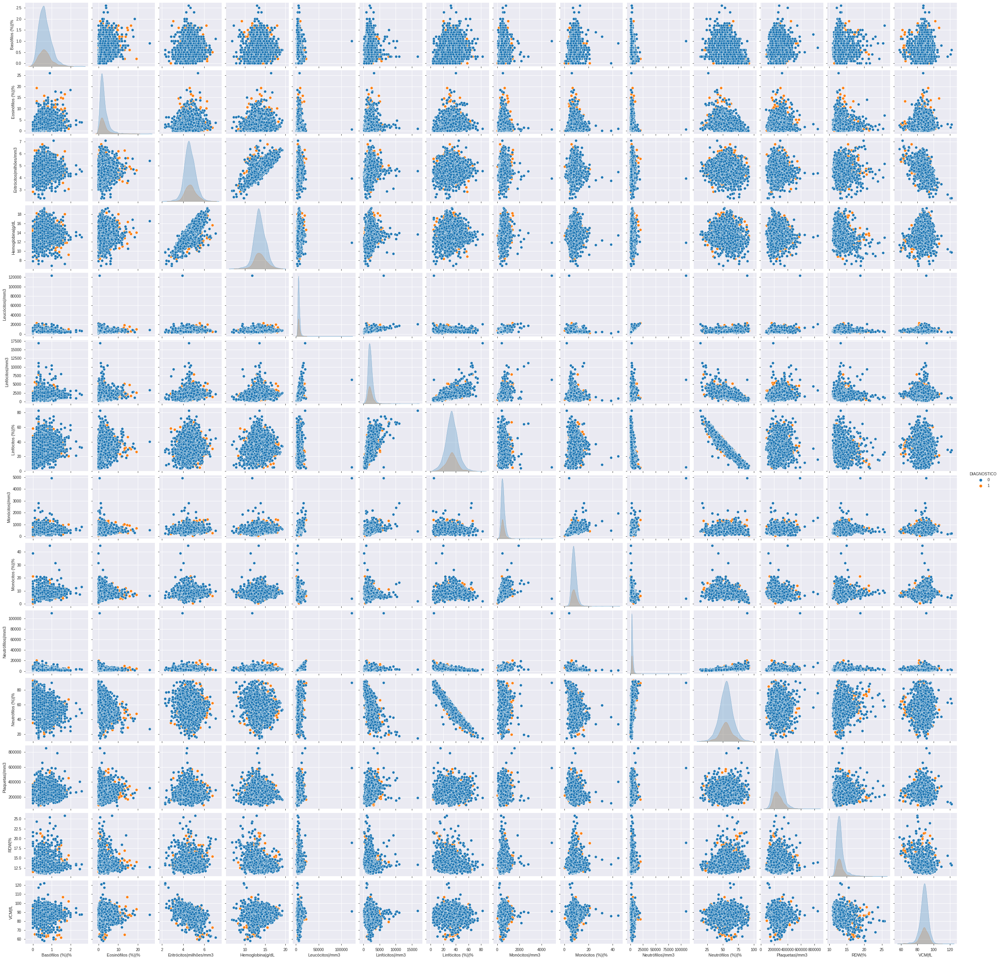

In [ ]:
sns.pairplot(fleury_pair_plot_1, hue="DIAGNOSTICO")

In [ ]:
fleury_ver = pd.read_csv('/content/drive/MyDrive/LAB_FLEURY/FLEURY_ML.csv', sep=',', encoding='latin-1')

In [ ]:
fleury_ver.info()

In [ ]:
exames_realizados = ['HEMOGRAMA, sangue total', 'URINA TIPO I - JATO MEDIO',
                     'BILIRRUBINAS, soro', 'INSULINA, soro',
                     'CREATININA, soro', 'HORMONIO TIROESTIMULANTE (TSH), soro',
                     'TRANSAMINASE GLUTAMICO-PIRUVICA (TGP)', 'Outros']

numero_exames = [37, 10, 2, 1, 1, 1, 1, 46]

In [ ]:
plt.figure(figsize=(6,4))
plt.barh(exames_realizados, numero_exames, color='green')
plt.rcParams['font.size'] = '10'

plt.ylabel('Exames')
plt.xlabel('Exames realizados (%)')
plt.show()

In [ ]:
plt.figure(figsize = (7,2.5))

sns.set(style="whitegrid", color_codes=True, font_scale=0.9)
sns.barplot(x = 'Variables', y = 'NaN Values', data=missing_values)
plt.xticks(rotation = 90)
plt.xlabel( "Variables" , size = 12 ) 
plt.ylabel( "NaN Values" , size = 10 )
#plt.title( "Missing values for the dataset" , size = 8 ) 
#plt.savefig('VALORES_AUSENTES.png', format='png')
plt.show()